<h1 align="center">Fourier Transforms</h1>

    Nate Robinson
    29 November 2018

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
import IPython
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
from scipy import fftpack
from scipy import signal
import time

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        #Let's store those values
        self.rate = rate
        self.samples = samples.real

    def plot(self,plot_frequencies = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #Create x and y
        y = self.samples
        x = np.arange(len(y))/rate
        
        #make an axis:
        if plot_frequencies:
            ax = plt.subplot(121)
        else:
            ax = plt.subplot(111)
        
        #Now let's try and plot this thing.
        ax.plot(x,y)
        #Need ylim's and whatnot
        ax.set_ylim(-32768,32767)
        ax.set_title("Sound Wave Graph")
        ax.set_xlabel("seconds")
        ax.set_ylabel("samples")
        
        if plot_frequencies:
            #New subplot!
            ax2 = plt.subplot(122)
            
            #Get the dft using scipy
            dft = fftpack.fft(self.samples)
            size = len(self.samples)
            #Calculate x,y with x in Hz
            y = np.abs(dft)
            x = np.arange(size)*self.rate/size
            
            #Plot them
            ax2.plot(x,y)
            #limit the x-axis and whatnot
            ax2.set_xlim(0,size/4)
            ax2.set_xlabel("Frequency (Hz)")
            ax2.set_ylabel("Magnitude")
            ax2.set_title("Visualization of the DFT")
            
        #And to display the graph
        plt.show()
            
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #First let's check if we need to scale.
        if self.samples.dtype != 'int16' or force == True:
            self.samples = np.int16(self.samples*32767./np.abs(max(self.samples)))
        
        #Now we write a new file.
        wavfile.write(filename,self.rate,self.samples)
        
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #Check if they the same length
        if len(self.samples) != len(other.samples):
            raise ValueError("Samples must be the same length")
        
        return SoundWave(self.rate,np.array([self.samples[i]+other.samples[i] for i in range(len(self.samples))]))

    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check if their rates are the same
        if self.rate != other.rate:
            raise ValueError("Both samples must have the same rate")
        
        return SoundWave(self.rate, np.hstack((self.samples,other.samples)))
    
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Are their rates the same?
        if self.rate != other.rate:
            raise ValueError("Both samples must have the same rate")
            
        #Append zeros to make the two wave arrays the same length
        if len(self.samples) > len(other.samples):
            other_samples = np.hstack((other.samples, np.zeros(len(self.samples) - len(other.samples))))
            self_samples = self.samples
        elif len(other.samples) > len(self.samples):
            self_samples = np.hstack((self.samples, np.zeros(len(other.samples) - len(self.samples))))
            other_samples = other.samples
        
        #Get that convolution!
        return SoundWave(self.rate, fftpack.ifft( fftpack.fft(self_samples) * fftpack.fft(other_samples) ))
            
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Are their rates the same?
        if self.rate != other.rate:
            raise ValueError("Both samples must have the same rate")
        
        #Get 2^a that is the smallest power of 2 greater than m+n-1
        m = len(self.samples)
        n = len(other.samples)
        a = np.ceil((np.log2(m+n-1)))
        desired_length = int(2**a)
        
        #Append zeros since we like to have a number of entries that is a power of 2
        self_samples = np.hstack((self.samples, np.zeros(desired_length-m)))
        other_samples = np.hstack((other.samples, np.zeros(desired_length-n)))
        
        #Get the convolution
        return SoundWave(self.rate, fftpack.ifft( fftpack.fft(self_samples) * fftpack.fft(other_samples) )[:m+n-1])
        
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #Take dft of samples
        dft = fftpack.fft(self.samples)
        #Get the desired indices
        n = len(self.samples)
        k_low,k_high = int(low_freq*n/self.rate),int(high_freq*n/self.rate)
        
        #Turn the amplitudes of the noise to zero
        dft[k_low:k_high+1] = 0
        #Let us not forget symmetry of the dft
        dft[n-k_high-1:n-k_low] = 0
        
        self.samples = fftpack.ifft(dft).real

### 1.1: Visualizing the sound wave

- Using `SoundWave.plot()` on 'tada.wav'

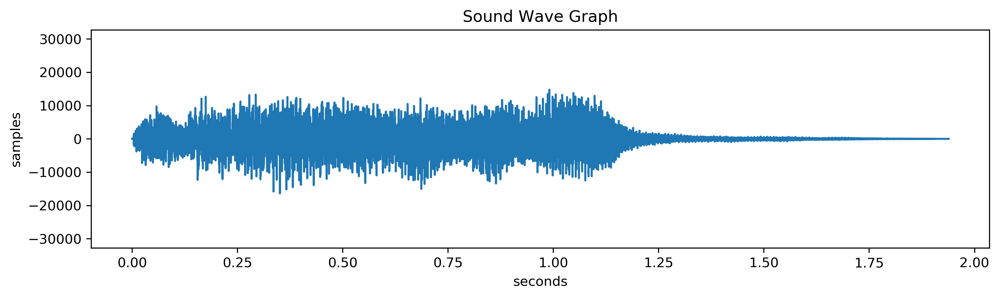

In [4]:
#First, read in the file with scipy.io.wavefile.read()
rate,samples = wavfile.read("tada.wav")
#Use the class
tada_wave = SoundWave(rate,samples)
tada_wave.plot()

### 1.2: Rescaling the sound wave

- Use `SoundWave.export()` to create a playable version of the sound wave, and rescale it if force=True.
- Create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (using `force=True`). In this case the scaling the wave results in an audio file that is louder.
- Use `IPython.display.Audio()` to embed the audio versions of `tada.wav` in the notebook.

In [5]:
#Original file
IPython.display.Audio("tada.wav")

In [6]:
#Exported but unchanged
tada_wave.export("unchanged_tada.wav")
IPython.display.Audio("unchanged_tada.wav")

In [7]:
#Exported and changed
tada_wave.export("changed_tada.wav", True)
IPython.display.Audio("changed_tada.wav")

### 1.3: Generate a note

- Make `generate_note()` to create our own note!

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #Set rate, create 44100 x values, and create 44100 samples
    rate = 44100
    x = np.linspace(0,duration,rate*duration)
    samples = np.sin(2*np.pi*frequency*x)
    
    sound = SoundWave(rate,samples)
    
    return sound
    
    

In [9]:
#We create an A (440 Hz) that will last for 2 seconds
A_sound = generate_note(440,2)
A_sound.export("A_sound.wav")
IPython.display.Audio("A_sound.wav")


### 1.4: Adding and concatenating notes into chords and arpeggios

- Use the `SoundWave.__add__()` method to make a chord
- Then use the `SoundWave.__rshift__()` method to create an arpeggio. For this case, we'll create the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [10]:
#Generate a three-second A minor chord (A, C, and E) and embed it in the notebook
A_sound = generate_note(440,3)
C_sound = generate_note(523.25,3)
E_sound = generate_note(659.25,3)

chord = A_sound+C_sound+E_sound
chord.export("chord.wav")

IPython.display.Audio("chord.wav")

In [11]:
#Create A --> C --> E arpeggio
A_sound = generate_note(440,1)
C_sound = generate_note(523.25,1)
E_sound = generate_note(659.25,1)

arpeggio = A_sound >> C_sound >> E_sound
arpeggio.export("arpeggio.wav")

IPython.display.Audio("arpeggio.wav")

### 1.5: Discrete Fourier Transform

- Make `simple_dft()`, which finds the discrete fourier transform for an array of samples, with the formula for $c_k$ given below.

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #First we assign n
    n = len(samples)
    
    #Initialize and construct
    
    #We're doing this the matrix way. dft = (1/n)* W @ samples
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j*np.pi/n)*m@m.T)
    W = W.real
    
    #Now E is made
    dft = (1/n)*W@samples
    
    #Done
    return dft

Now let's test our function to prove it works!

In [13]:
for n in range(10,25):
    s = np.random.random(n)
    
    if np.allclose(simple_dft(s)*n,fftpack.fft(s).real):
        print("Good")
    else:
        print("NOOOOOO")

Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good


### 1.6: Fast Fourier Transform

- Make `simple_fft()` to find the discrete fourier transform using the fast-fourier-transform formula. (Smaller temporal complexity.)

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #We take a recursive strategy
    def split(g):
        n = g.shape[0]
        #If n is small enough, just use our dft function
        if n <= threshold:
            return n*simple_dft(g)
        else:
            #Get the dft for every other entry
            even = split(g[::2])
            #And again for the odd entries
            odd = split(g[1::2])
            k = np.arange(n)
            #Calculate the exponential part of the series
            z = np.exp(-2j*np.pi*k/n)
            #Middle index for z
            m = n//2
            #We use the Hardaman product
            return np.hstack( [even+z[:m]*odd, even+z[m:]*odd] )
    return split(samples)/len(samples)

Print the runtimes of each computation.

In [15]:
#Generate an array of 8192 random samples and... 
s = np.random.random(8192)

#... take its DFT using `simple_dft()`,...
start = time.time()
dft = simple_dft(s)
print("Simple DFT: ", str(time.time()-start))

#... `simple_fft()`,
start = time.time()
fft = simple_fft(s)
print("Simple FFT: ", str(time.time()-start))

#... and `scipy.fftpack.fft()`.
start = time.time()
scipy_fft = fftpack.fft(s)
print("Scipy FFT: ", str(time.time()-start))

#Check our fft function gets the same results as the scipy one.
if np.allclose(8192*fft,scipy_fft):
    print("Good")
else:
    print("NOOOOOO")

Simple DFT:  5.913766145706177
Simple FFT:  0.18987059593200684
Scipy FFT:  0.00026702880859375
Good


### 1.7: Visualize the Fourier Transform

- If we pass plot=True through `SoundWave.plot()`, we can plot the DFT (in the right subplot) with frequencies present on the $x$-axis and the magnitudes of those frequences on the $y$-axis.

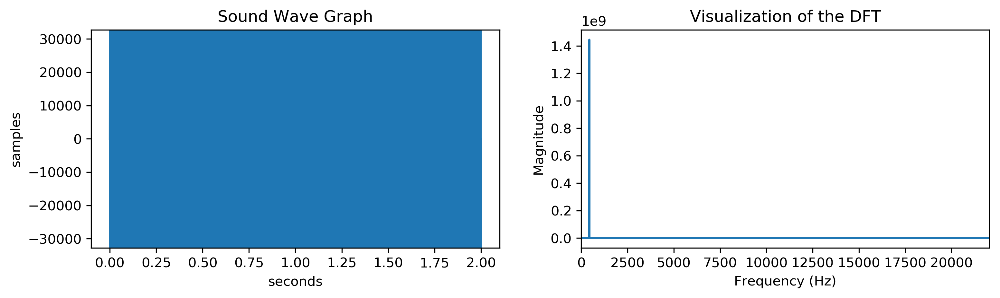

In [16]:
#Display the plot of the DFT of an A tone.
rate,samples = wavfile.read("A_sound.wav")
A_sound_wave = SoundWave(rate,samples)
A_sound_wave.plot(True)

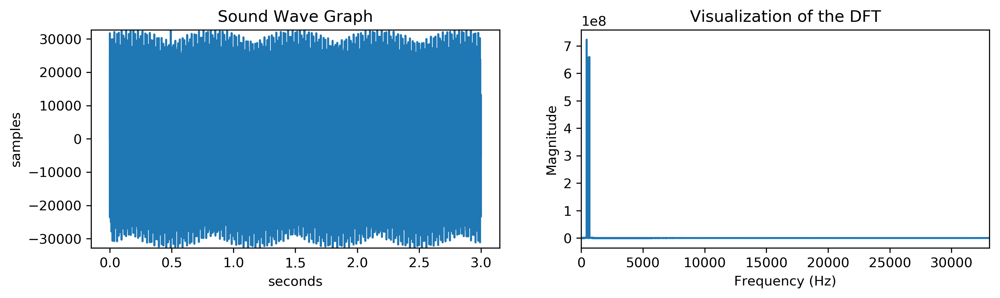

In [17]:
#Display the plot of the DFT of an A minor chord.
rate,samples = wavfile.read("chord.wav")
chord_wave = SoundWave(rate,samples)
chord_wave.plot(True)

### 1.8: Use Fourier Transform to detect frequencies

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [18]:
#First read it in and initialize the class SoundWave
rate,samples = wavfile.read("mystery_chord.wav")
mystery_chord_wave = SoundWave(rate,samples)

#Festrict the samples now
samples = mystery_chord_wave.samples[:mystery_chord_wave.rate//2]

#Get the dft
dft = fftpack.fft(samples)
dft = dft
size = len(samples)

#Get the indices for the three largest values in the dft
largest_indices = np.argsort(np.abs(dft))[-6:][::2]

freqs = largest_indices*mystery_chord_wave.rate/size

print(freqs)

[588. 440. 784.]


So by the above frequencies, we have $A_4$, $D_5$, and $G_5$ present.

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### 2.1: Circular Convolution

- Implement `SoundWave.__mul__()` for the circular convolution of two waves.

We create some white noise and convolve it with the tada sound. Notice this makes the sound uniform throughout the 2 seconds.

In [19]:
#We construct a white noise wave
rate = 22050
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
white_wave = SoundWave(rate, white_noise)

#Now we convolve the white noise with our familiar tada_wave
convolution = tada_wave * white_wave

#Now we "embed" it
convolution.export("convolution.wav")
IPython.display.Audio("convolution.wav")

Now we concatentate to copies of the convolution. Notice there is no break between them, but the concatenation sounds like one continuous sound. (This is because the convolution is circular.)

In [20]:
#Now we glue two together
concatenation = convolution >> convolution
concatenation.export("concatenation.wav")
IPython.display.Audio("concatenation.wav")


### 2.2: Linear Convolution

- Implement `SoundWave.__pow__()` for linear convolution.
- Also we will time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` (our function) and `scipy.signal.fftconvolve()` (a function from scipy that does the same thing).

In [21]:
#Read them
rate,samples = wavfile.read("CGC.wav")
CGC = SoundWave(rate,samples)
rate,samples = wavfile.read("GCG.wav")
GCG = SoundWave(rate,samples)

#Time the convolutions...

#My function
start = time.time()
my_lin_conv = CGC**GCG
print("My way:",str(time.time()-start))

#Scipy's function
start = time.time()
scipy_lin_conv = SoundWave(rate,signal.fftconvolve(CGC.samples,GCG.samples)[:len(CGC.samples)+len(GCG.samples)-1])
print("Scipy:",str(time.time()-start))

My way: 0.08058762550354004
Scipy: 0.02523016929626465


In [22]:
#Original sounds
IPython.display.Audio("CGC.wav")

In [23]:
IPython.display.Audio("GCG.wav")

In [24]:
#Now we do a linear convolution and it sounds really cool!
my_lin_conv.export("my_lin_conv.wav")
IPython.display.Audio("my_lin_conv.wav")

In [25]:
#Scipy's way should sound the same as mine
scipy_lin_conv.export("scipy_lin_conv.wav")
IPython.display.Audio("scipy_lin_conv.wav")

### 2.3: One cool effect of linear convolution

Use `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` (a piano playing) and `balloon.wav` (a balloon popping and echoing in a room).
Embed the two original sounds and their convolution in the notebook. (Should sound like a piano being played in a concert hall!)

In [26]:
#Read in those files!
rate,samples = wavfile.read("chopin.wav")
chopin = SoundWave(rate,samples)
rate,samples = wavfile.read("balloon.wav")
balloon = SoundWave(rate,samples)

#Compute the convolution
#(only the first m+n+1 terms)
concert_chopin = SoundWave(rate,signal.fftconvolve(chopin.samples,balloon.samples)[:len(chopin.samples)+len(balloon.samples)-1])

In [27]:
#Now the only thing to do is embed the chopin
IPython.display.Audio("chopin.wav")

In [28]:
#Balloon sound (popping and echoing)
IPython.display.Audio("balloon.wav")

In [29]:
#Convolution of the two
#Notice that it sounds like a piano being played in a concert hall! :D
concert_chopin.export("concert_chopin.wav")
IPython.display.Audio("concert_chopin.wav")

### 2.4: Cleaning noise from sound waves

- Implement `SoundWave.clean()` to clean out noise.

In [30]:
#Make a SoundWave object for it
rate,samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate,samples)

#Display original
IPython.display.Audio("noisy1.wav")


In [31]:
#Now let's clean this puppy up by filtering out the frequencies from 1250 - 2600 Hz.
noisy1.clean(1250,2600)
noisy1.export("clean_noisy1.wav")

#Display clean one
IPython.display.Audio("clean_noisy1.wav")

In [32]:
#Make a SoundWave object for noisy2
rate,samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate,samples)

#Display original
IPython.display.Audio("noisy2.wav")


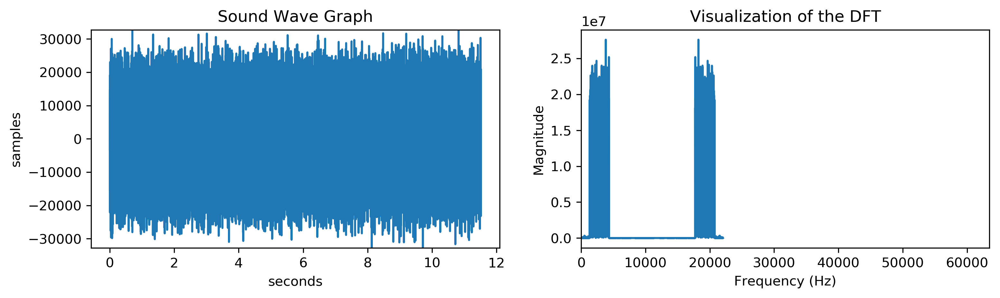

In [33]:
#Here we want to find out what frequencies to remove
#Now let's plot it to see what to remove
noisy2.plot(True)

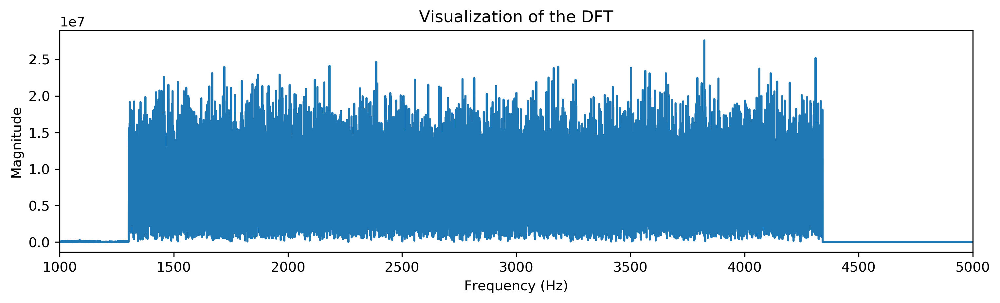

In [34]:
#And zoom in

#Get the dft using scipy
dft2 = fftpack.fft(noisy2.samples)
size2 = len(noisy2.samples)
#Calculate x,y with x in Hz
y2 = np.abs(dft2)
x2 = np.arange(size2)*noisy2.rate/size2

#Plot them
plt.plot(x2,y2)
#limit the x-axis and whatnot
plt.xlim(1000,5000)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.title("Visualization of the DFT")
plt.show()

It looks like the noise is between frequencies 1275 and 4350, about.

In [35]:
#Now let's clean it
noisy2.clean(1275,4350)
noisy2.export("clean_noisy2.wav")

#Display clean one
IPython.display.Audio("clean_noisy2.wav")

### 2.5: More noise-cleaning (an application from the World Cup)

During the 2010 World Cup in South Africa, large plastic horns called vuvuzelas
were blown excessively throughout the games. Broadcasting organizations faced difficulties with
their programs due to the incessant noise level. Eventually, audio filtering techniques were used
to cancel out the sound of the vuvuzela, which has a frequency of around 200–500 Hz.

This is what we're going to try!

In [36]:
#Display original
IPython.display.Audio("vuvuzela.wav")

In [37]:
#Let's read it in and whatnot
rate,samples_combo = wavfile.read("vuvuzela.wav")

#This wave is a stereo sound with 2 channels, so we treat them separately
vuvuzela1 = SoundWave(rate,samples_combo[:,0])
vuvuzela2 = SoundWave(rate,samples_combo[:,1])

#Clean them up!
vuvuzela1.clean(200,500)
vuvuzela2.clean(200,500)

#And embed it
IPython.display.Audio(rate=rate,data=np.vstack((vuvuzela1.samples,vuvuzela2.samples)))


### 2.6: Cleaning noise from images

We can clean noise from visual images using the Fourier Transform as well. Here we need a 2-dimensional DFT.
We plot the original image and then the cleaned up one. (Note the registration number in the bottom right corner of the original is more or less illegible.)

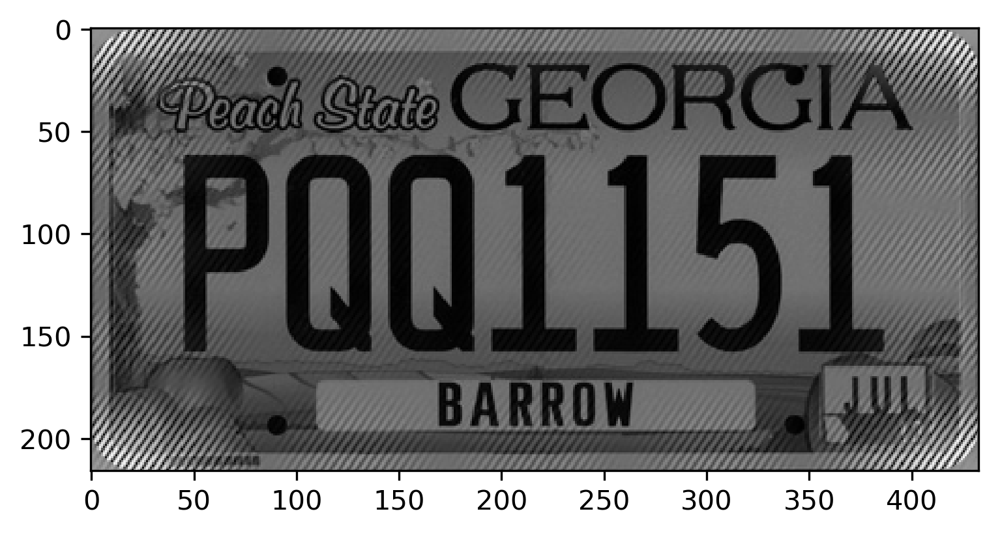

In [38]:
#Before we take another step we have got to read this file in
import imageio
im = imageio.imread("license_plate.png")

#Plot original image
plt.imshow(im,cmap="gray")
plt.show()

That was the original image. Now we look at the 2-D DFT to find spots of extra high-frequency (the noise). The noisy frequencies will show up as bright spots on the mostly gray image.

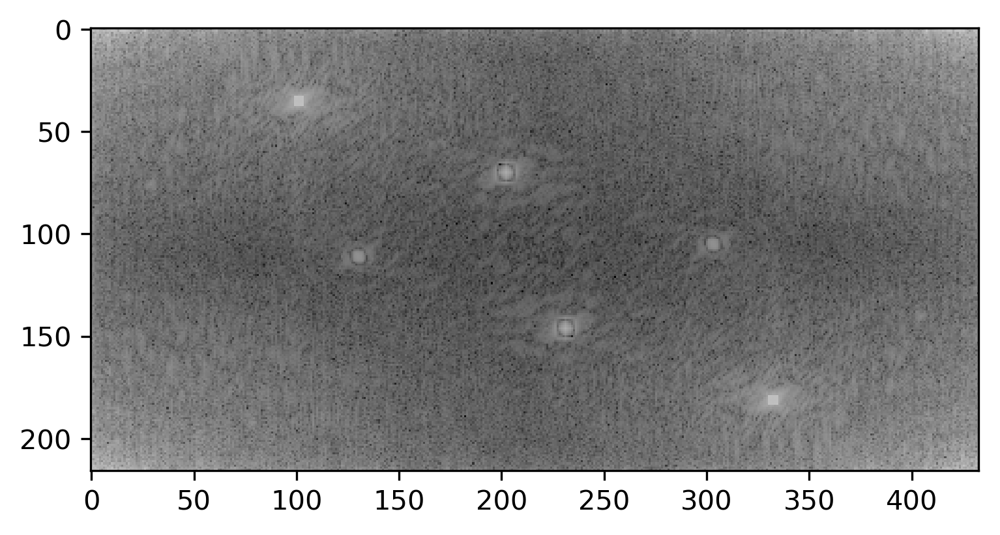

In [39]:
#And let's plot the log magnitude of the image's DFT
im_dft = fftpack.fft2(im)
plt.imshow( np.log(np.abs(im_dft)),cmap="gray" )
plt.show()

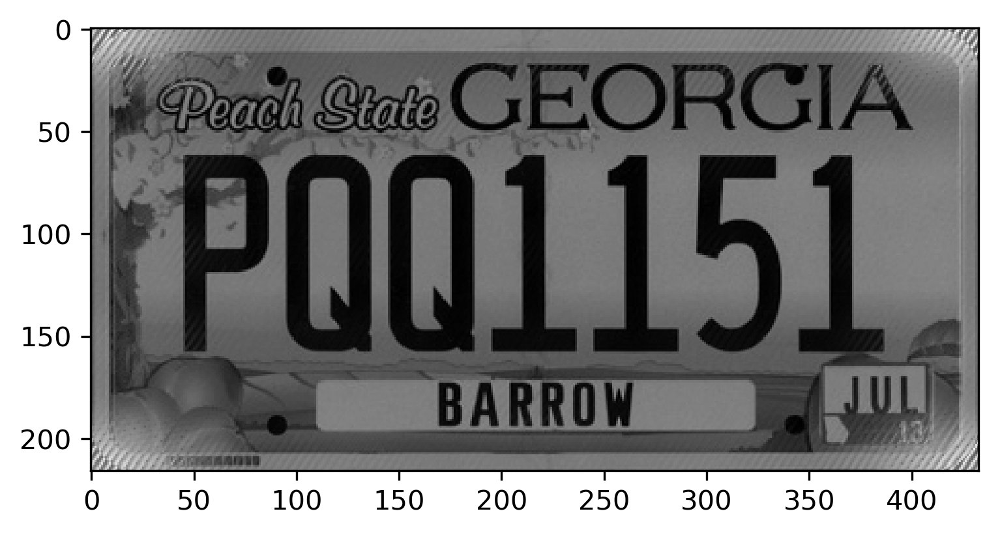

In [40]:
#We need to fix it!
#Let's find the mean value of the whole DFT (like a medium-gray color in the above visual)
mean = im_dft.mean().real
width,height = im_dft.shape

#We approximate by eyeball where the white spots are and cover them up with rectangles of medium-gray, essentially
im_dft[30:45,85:105] = mean
im_dft[105:115,125:135] = mean
im_dft[65:80,195:205] = mean
im_dft[140:155,220:235] = mean
im_dft[90:110,300:310] = mean
im_dft[175:190,330:340] = mean

#And take the ifft to get back to the image
new_im = np.abs(fftpack.ifft2(im_dft))

#Plot the new image
plt.imshow(new_im,cmap="gray")
plt.show()

Note the number in the corner is now legible!